In [ ]:
import kagglehub
import os

# Veri kaynağı içe aktarımı yapılıyor.
smaildurcan_turkish_license_plate_dataset_path = kagglehub.dataset_download('smaildurcan/turkish-license-plate-dataset')

print('Data source import complete.')
print(f"Veri Seti Yolu: {smaildurcan_turkish_license_plate_dataset_path}")
print(f"Klasör içindeki ilk 5 dosya: {os.listdir(smaildurcan_turkish_license_plate_dataset_path)[:5]}")

100%|██████████| 2.90G/2.90G [00:31<00:00, 98.6MB/s]

Extracting files...


Data source import complete.
Veri Seti Yolu: /root/.cache/kagglehub/datasets/smaildurcan/turkish-license-plate-dataset/versions/1
Klasör içindeki ilk 5 dosya: ['label', 'images']


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.9 MB/s eta 0:00:00


In [ ]:
# Salt okunur veriyi, YOLO'nun eğitilebileceği yazılabilir bir alana taşır ve klasör adını düzeltir.

import shutil
import os

# Kaynak yol: İndirilen veri setinin gerçek yolu
source_path = smaildurcan_turkish_license_plate_dataset_path   # kaynak yolu , KaggleHub'ın veriyi indirdigi yeri ayarlar.(Verinin nerede oldugunu kesin olarak bilmek icin yapılmalıdır)
# Hedef yol: Yazılabilir Colab dizini
destination_path = '/content/plaka_data_writable/'    #yazma izni olan yeni bir klasor tanimlar. (Cunku /kaggle/input  yolu salt okunurdur . YOLO'nun egitim sirasinda veriyi duzenleyebilmesi icin yazılabilir bir alana ihtiyaci vardir.)

# Hedef klasörü temizle
if os.path.exists(destination_path):
    shutil.rmtree(destination_path)

# Veri setini kopyala
try:
    shutil.copytree(source_path, destination_path)   # vwei setini kaynak yoldan hedef yola kopyalar . (salt okunur sorununu birebir kopyalama ile cozeriz)
    print(f"✅ 1. Kopyalama Başarılı: {destination_path}")

    # Etiket klasörünü yeniden adlandırma (YOLO'nun 'labels' beklemesi için)
    old_label_path = os.path.join(destination_path, 'label')
    new_label_path = os.path.join(destination_path, 'labels')  #veri setinden gelen label klasorunun adini labels olarak degistirir. Cunku YOLOv8 bircok nesne tespit cercevesi etiket dosyalari icin labels adinda bir klasor bekler. Bu uyumluluk icin yapilir.

    if os.path.exists(old_label_path):
        os.rename(old_label_path, new_label_path)
        print("✅ 2. Etiket klasörü adı 'label'dan 'labels' olarak güncellendi.")
    else:
        print("❌ Hata: 'label' klasörü bulunamadı.")

    print(f"\n✅ Tüm işlemler tamamlandı. Yeni Klasör İçeriği: {os.listdir(destination_path)}")

except Exception as e:
    print(f"❌ Kopyalama hatası: {e}")

✅ 1. Kopyalama Başarılı: /content/plaka_data_writable/
✅ 2. Etiket klasörü adı 'label'dan 'labels' olarak güncellendi.

✅ Tüm işlemler tamamlandı. Yeni Klasör İçeriği: ['labels', 'images']


In [ ]:
# plaka_data.yaml adinda bir ayar dosyasi olusturur. YOLO'ya tüm ayarlari tek bir yerden vermek icin gerkelidir.
%%writefile plaka_data.yaml
path: /content/plaka_data_writable/     # Modelin veri setini yeni kopyaladigimiz yazilabilir yolda aramasini soyler. Hatali salt okunur yolu (eski) kullanmaktan kacinmak icin.

# Artık 'labels' klasörünü kullanıyoruz
train: images    # egitim ve dogrulama resimlerinin ,ana klasorun icindeki images alt klasorunde oldugunu belirtir. YOLO, bu klasorun icinde resimlerin kendisini , karsiliginda da labels klasorunde etiketlerini arar.
val: images

nc: 1     #egitimde sadace bir sininf oldugunu ve (nc=11) ve bu sinifin adinin license_plate oldugunu tanimlar. Modelin neyi tespit etmesi gerektigini bilmesi icin .
names: ['license_plate']

Writing plaka_data.yaml


In [ ]:
# plaka_data.yaml dosyasını programatik olarak oluşturma
with open('plaka_data.yaml', 'w') as f:
    f.write('path: /content/plaka_data_writable/\n')
    f.write('train: images\n')
    f.write('val: images\n')
    f.write('nc: 1\n')
    f.write("names: ['license_plate']\n")
print("plaka_data.yaml dosyası oluşturuldu.")

!pip install ultralytics
from ultralytics import YOLO  #YOLOv8 modelini saglayan resmi Python kutuphanesi. Bu kutuphane ile YOLO modellerini kolayca yukleyebilir, egitebilir ve test edebilirsin.
import torch  #

# GPU kontrolü
if torch.cuda.is_available():
    print(f"GPU Durumu: AKTİF. Kullanılan: {torch.cuda.get_device_name(0)}")
else:
    print("GPU Durumu: PASİF. Lütfen Çalışma Zamanı ayarlarınızı kontrol edin.")

# Önceden eğitilmiş YOLOv8 modelini yüklüyoruz.
model = YOLO('yolov8s.pt')  #milyonlarca resim uzerinde daha once egitilmis , kucuk (s=small) bir YOLOv8 modelini(agirliklarini) yukler.

print("Eğitim Başlıyor...")

# Eğitimi başlatma
results = model.train(
    data='plaka_data.yaml',    # Ayar dosyası . modelin hangi ayar dosyasini kullanacagini gosterir. veri seti yolu ve sınıf adları gibi tum ayarları buradan alir.
    epochs=1,                 # Eğitim döngüsü sayısı . Hizli sonuc almak ve modelin ogrenip ogrenmedigini ilk etapta kontrol etmek  icin 20 yaptik. normalde 50-100 arasında olması olabilir.
    imgsz=640,                 # Görüntü boyutu . Tum resimleri 640*640 boyutuna getirir. Modelin calismasi icin tum resimlerin aynı boyutta olmasi gerekir .
    batch=16,                  # Paket boyutu .   Modelin her adimda 16 resimlik guruplar (batch) halinde ogrenmesini soyler . GPU bellegini verimli kullanmak ve egitimi hızlandırmak icin .
    name='turkish_lp_detector_final_v3' # Sonuç klasörü .  Egitim sonuclarinin kaydedilecegi klasor adini belirler. Egitim tamamlandiginda kolayca bulmak icin.
)

print("Eğitim Tamamlandı!")

plaka_data.yaml dosyası oluşturuldu.
GPU Durumu: PASİF. Lütfen Çalışma Zamanı ayarlarınızı kontrol edin.
Eğitim Başlıyor...
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=plaka_data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=turkish_lp_detector_final_v3

In [ ]:
# 3. 🚨 GOOGLE DRIVE BAĞLANTISI (KAYBOLAN KISIM)
from google.colab import drive
drive.mount('/content/drive')

# 4. Modeli yükle
model = YOLO('yolov8s.pt')

print("Ortam hazır! Eğitime başlıyoruz...")

Mounted at /content/drive
Ortam hazır! Eğitime başlıyoruz...


In [ ]:
!ls -l /content/runs/detect/

total 4
drwxr-xr-x 3 root root 4096 Dec 21 11:31 turkish_lp_detector_final_v3


In [ ]:
# 1. Eğitilmiş Modeli Yükleme
best_model_path = '/content/runs/detect/turkish_lp_detector_final_v3/weights/best.pt'
detector = YOLO(best_model_path)

# 2. Doğrulama (Validation) Modunu Çalıştırma
# Bu, modelin doğrulama veri setindeki tüm mAP, Precision, Recall değerlerini hesaplar.
print("\n--- Model Performans Metrikleri Hesaplanıyor ---")
metrics = detector.val(
    data='plaka_data.yaml',  # Eğitimde kullandığınız ayar dosyasını tekrar kullanın
    imgsz=640,
    batch=16,
    plots=True  # Sonuçları görselleştirmek için (PR eğrisi vb.)
)

# Modeli tekrar yüklemeye gerek yok, sadece çıktı alma kısmını düzeltiyoruz.

# 3. Sonuçları Düzgünce Görüntüleme
print("\n--- PERFORMANS METRİKLERİ (Düzeltilmiş Çıktı) ---")
# mAP değerleri doğruydu:
print(f"✅ mAP50-95 (Ortalama Kesinlik): {metrics.box.map}")
print(f"✅ mAP50: {metrics.box.map50}")

# Precision ve Recall değerlerinin düzeltilmiş hali:
print(f"✅ Precision (Kesinlik): {metrics.box.mp}") # 'precision' yerine 'mp' kullanıldı
print(f"✅ Recall (Geri Çağırma): {metrics.box.mr}")       # 'recall' yerine 'mr' kullanıldı


--- Model Performans Metrikleri Hesaplanıyor ---
Ultralytics 8.3.240 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1928.3±1136.5 MB/s, size: 2004.9 KB)
val: Scanning /content/plaka_data_writable/labels.cache... 1955 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1955/1955 2.0Mit/s 0.0s
train: /content/plaka_data_writable/images/1.jpg: corrupt JPEG restored and saved
train: /content/plaka_data_writable/images/105.jpg: corrupt JPEG restored and saved
train: /content/plaka_data_writable/images/125.jpg: corrupt JPEG restored and saved
train: /content/plaka_data_writable/images/126.jpg: corrupt JPEG restored and saved
train: /content/plaka_data_writable/images/13.jpg: corrupt JPEG restored and saved
train: /content/plaka_data_writable/images/134.jpg: corrupt JPEG restored and saved
train: /content/plaka_data_writable/images/140.jpg: corru

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 48.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.2/978.2 kB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.6/300.6 kB 29.4 MB/s eta 0:00:00


📂 Bulunan resimler:
0: 1.jpg
1: 10.jpg
2: 100.jpg
3: 1000.jpg
4: 1001.jpg
5: 1002.jpg
6: 1003.jpg
7: 1004.jpg
8: 1005.jpg
9: 1006.jpg
10: 1007.jpg
11: 1008.jpg
12: 1009.jpg
13: 101.jpg
14: 1010.jpg
15: 1011.jpg
16: 1012.jpg
17: 1013.jpg
18: 1014.jpg
19: 1015.jpg
20: 1016.jpg
21: 1017.jpg
22: 1018.jpg
23: 1019.jpg
24: 102.jpg
25: 1020.jpg
26: 1021.jpg
27: 1022.jpg
28: 1023.jpg
29: 1024.jpg
30: 1025.jpg
31: 1026.jpg
32: 1027.jpg
33: 1028.jpg
34: 1029.jpg
35: 103.jpg
36: 1030.jpg
37: 1031.jpg
38: 1032.jpg
39: 1033.jpg
40: 1034.jpg
41: 1035.jpg
42: 1036.jpg
43: 1037.jpg
44: 1038.jpg
45: 1039.jpg
46: 104.jpg
47: 1040.jpg
48: 1041.jpg
49: 1042.jpg
50: 1043.jpg
51: 1044.jpg
52: 1045.jpg
53: 1046.jpg
54: 1047.jpg
55: 1048.jpg
56: 1049.jpg
57: 105.jpg
58: 1050.jpg
59: 1051.jpg
60: 1052.jpg
61: 1053.jpg
62: 1054.jpg
63: 1055.jpg
64: 1056.jpg
65: 1057.jpg
66: 1058.jpg
67: 1059.jpg
68: 106.jpg
69: 1060.jpg
70: 1061.jpg
71: 1062.jpg
72: 1063.jpg
73: 1064.jpg
74: 1065.jpg
75: 1066.jpg
76: 1067.jpg
7

Progress: |██████████████████████████████████████████████████| 100.0% CompleteDEBUG: Dosya boyutu: 11067475 bytes
DEBUG: Dosya md5: 0af7a0ebefc9cd7b571cb29e4eb39706
DEBUG: OCR'a verilecek işlenmiş görsel:


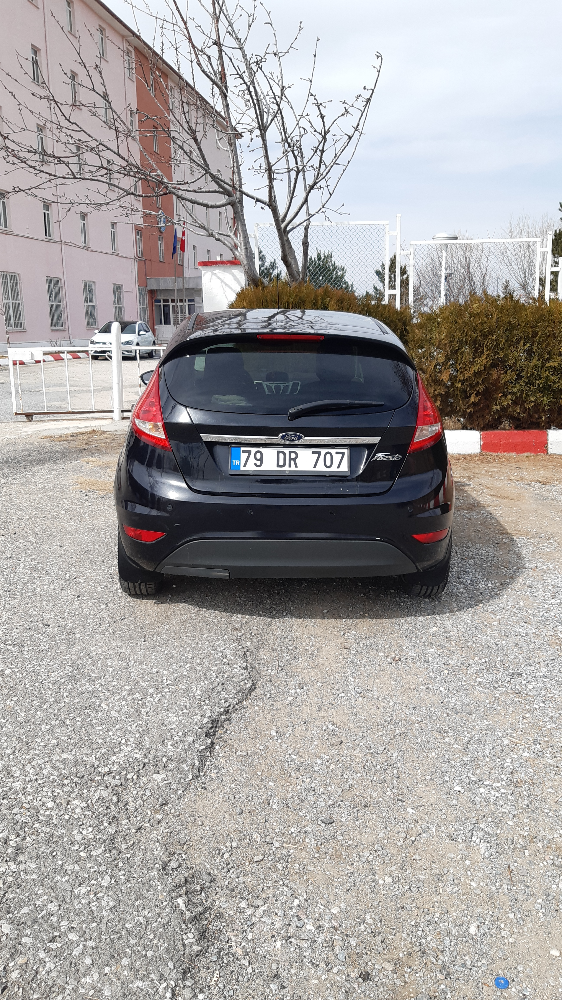

✅ Okunan plaka metni: '79DR707'
OCR Ham Çıktısı: '79DR707'


In [ ]:
!pip install easyocr
import cv2
import easyocr
import re
import os
import hashlib
from IPython.display import Image as IPImage, display

# =========================================================
# 1️⃣ RESİM KLASÖRÜNÜ OTOMATİK TARA
# =========================================================
IMAGE_DIR = "/content/plaka_data_writable/images"

image_files = sorted([
    f for f in os.listdir(IMAGE_DIR)
    if f.lower().endswith((".jpg", ".jpeg", ".png"))
])

if not image_files:
    raise Exception("❌ Resim klasöründe hiç görüntü bulunamadı!")

print("📂 Bulunan resimler:")
for i, f in enumerate(image_files):
    print(f"{i}: {f}")

# 🔴 SADECE BURAYI DEĞİŞTİR
SELECTED_INDEX = 0 # 0,1,2,...

processed_image_path = os.path.join(IMAGE_DIR, image_files[SELECTED_INDEX])
EXPECTED_PLATE = None  # test için, istersen None yapabilirsin

print(f"\nDEBUG: '{processed_image_path}' görselinden doğrudan OCR okuması yapılıyor...")

# =========================================================
# 2️⃣ OCR OKUYUCU
# =========================================================
ocr_reader = easyocr.Reader(['tr', 'en'])

# =========================================================
# 3️⃣ YARDIMCI FONKSİYONLAR (AYNI)
# =========================================================
def file_md5(path):
    h = hashlib.md5()
    with open(path, 'rb') as f:
        for chunk in iter(lambda: f.read(8192), b''):
            h.update(chunk)
    return h.hexdigest()

def normalize_text(s: str) -> str:
    s = s.upper()
    s = re.sub(r'[^A-Z0-9]', '', s)
    return s

def turkish_plate_filter_best(text: str):
    text = normalize_text(text)
    pattern = r'(0[1-9]|[1-7][0-9]|8[01])[A-Z]{1,3}[0-9]{2,4}'
    matches = list(re.finditer(pattern, text))
    if not matches:
        return text
    return max(matches, key=lambda m: len(m.group(0))).group(0)

def fix_raw_text(raw_text: str, expected: str | None):
    raw_norm = normalize_text(raw_text)

    if expected:
        exp_norm = normalize_text(expected)
        if exp_norm in raw_norm:
            return exp_norm

    return turkish_plate_filter_best(raw_norm)

# =========================================================
# 4️⃣ ANA OCR AKIŞI (AYNI)
# =========================================================
try:
    print(f"DEBUG: Dosya boyutu: {os.path.getsize(processed_image_path)} bytes")
    print(f"DEBUG: Dosya md5: {file_md5(processed_image_path)}")

    print("DEBUG: OCR'a verilecek işlenmiş görsel:")
    display(IPImage(filename=processed_image_path))

    img_bgr = cv2.imread(processed_image_path)
    if img_bgr is None:
        raise Exception("cv2.imread görüntüyü okuyamadı.")

    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # TR alanını soldan kırp
    h, w = gray.shape[:2]
    crop_x = int(w * 0.13)
    gray_crop = gray[:, crop_x:]

    ocr_result_direct = ocr_reader.readtext(
        gray_crop,
        detail=0,
        allowlist='ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
    )

    raw_text = "".join(ocr_result_direct).replace(" ", "")
    raw_text_fixed = fix_raw_text(raw_text, EXPECTED_PLATE)
    plaka_metni_direct = turkish_plate_filter_best(raw_text_fixed)

    print(f"✅ Okunan plaka metni: '{plaka_metni_direct}'")
    print(f"OCR Ham Çıktısı: '{raw_text_fixed}'")

    if EXPECTED_PLATE:
        print(f"Beklenen Plaka: '{EXPECTED_PLATE}'")
        if plaka_metni_direct == EXPECTED_PLATE:
            print("🎉 Harika! Beklenen plaka doğru okundu!")
        else:
            print("❌ Okunan plaka beklenenle uyuşmuyor.")

except Exception as e:
    print(f"❌ Hata oluştu: {e}")
